# Dataset and Predictions Visualizations (Depth Anything V1 & V2, Zoe Depth)

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [13]:
# Defining paths to images
paths = {
    "original": "/home/lucijatonkovic/Documents/Data/CIL/Train_Images_25",
    "gt": "/home/lucijatonkovic/Documents/Data/CIL/Train_Images_GT",
    "dav1": "/home/lucijatonkovic/Documents/Git/Depth-Anything/train_depths_l_po",
    "dav2": "/home/lucijatonkovic/Documents/Git/Depth-Anything-V2/train_depths_b",
    "zoe": "/home/lucijatonkovic/Documents/Git/ZoeDepth/train_depths_only",
}

paths_depths = {
    "original": "/home/lucijatonkovic/Documents/Data/CIL/ethz-cil-monocular-depth-estimation-2025/test/test",
    "dav1" : "/home/lucijatonkovic/Documents/Data/CIL/PredictionDepths/NoTuning/DepthAnything",
    "dav2" : "/home/lucijatonkovic/Documents/Data/CIL/PredictionDepths/NoTuning/DepthAnythingV2",
    "zoe" : "/home/lucijatonkovic/Documents/Data/CIL/PredictionDepths/NoTuning/ZoeDepth_npy"
}

paths_train_depths = {
    "original": "/home/lucijatonkovic/Documents/Data/CIL/Train_Images_25",
    "gt": "/home/lucijatonkovic/Documents/Data/CIL/Train_Images_GT",
    "dav1" : "/home/lucijatonkovic/Documents/Data/CIL/TrainDepths25/NoTuning/DepthAnything",
    "dav2" : "/home/lucijatonkovic/Documents/Data/CIL/TrainDepths25/NoTuning/DepthAnythingV2",
    "zoe" : "/home/lucijatonkovic/Documents/Data/CIL/TrainDepths25/NoTuning/ZoeDepth"
}

In [14]:
image_stems = [
    os.path.splitext(f)[0]
    for f in os.listdir(paths["original"])
    if f.endswith(".png")
]

In [6]:
image_stems

['sample_000000_rgb',
 'sample_000001_rgb',
 'sample_000002_rgb',
 'sample_000003_rgb',
 'sample_000004_rgb',
 'sample_000005_rgb',
 'sample_000006_rgb',
 'sample_000007_rgb',
 'sample_000008_rgb',
 'sample_000009_rgb',
 'sample_000010_rgb',
 'sample_000011_rgb',
 'sample_000012_rgb',
 'sample_000013_rgb',
 'sample_000014_rgb',
 'sample_000015_rgb',
 'sample_000016_rgb',
 'sample_000017_rgb',
 'sample_000018_rgb',
 'sample_000019_rgb',
 'sample_000020_rgb',
 'sample_000021_rgb',
 'sample_000022_rgb',
 'sample_000023_rgb',
 'sample_000024_rgb']

## Functions

In [15]:
def load_data_from_folder(folder_path):
    """
    Load all .png and .npy files from a folder into a list of NumPy arrays.
    Converts .png images to RGB format. .npy files are loaded as-is.

    Returns:
        data_list (list of np.ndarray): Loaded data.
        filenames (list of str): Corresponding filenames without extensions.
    """
    data_list = []
    filenames = []

    for file in sorted(os.listdir(folder_path)):
        file_path = os.path.join(folder_path, file)
        name, ext = os.path.splitext(file)

        if ext.lower() == '.png':
            img = Image.open(file_path).convert("RGB")
            data_list.append(np.array(img))
            filenames.append(name)
        elif ext.lower() == '.npy':
            arr = np.load(file_path)
            data_list.append(arr)
            filenames.append(name)
        else:
            print("Files are neither .png images or .npy")

    return data_list

In [16]:
def plot_single_image(img, title="Title"):
    plt.imshow(img)
    plt.title(title)
    plt.show

In [17]:
def visualize_image_grid(image_lists, column_titles, rows=25, cols=5, figsize=(15, 60)):
    """
    Visualize a grid of images from a list of lists of images (5 lists of 25 images).
    
    Parameters:
        image_lists (list of lists): A list containing 5 lists, each with 25 images.
        column_titles (list of str): Titles for each column.
        rows (int): Number of rows in the grid (default is 5).
        cols (int): Number of columns in the grid (default is 5).
        figsize (tuple): Size of the figure (default is (15, 15)).
    """
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    
    for i in range(rows):
        for j in range(cols):
            ax = axes[i, j]
            
            img_idx = i * cols + j
            img = image_lists[j][i]
            ax.imshow(img)
            ax.axis('off')  
            if i == 0:
                ax.set_title(column_titles[j], fontsize=14)
    
    plt.subplots_adjust(wspace=0.1, hspace=0.0001)
    #plt.tight_layout()
    plt.show()


In [18]:
def check_same_sizes(image_list):
    for i in range(1, len(image_list)):
        if image_list[i].shape != image_list[i - 1].shape:
            print("Not all images are the same size")
            return
    print("All images are the same size")

In [19]:
def invert_values(depth):
    return np.max(depth) - depth

## Visuaization

In [20]:
original_images = load_data_from_folder(paths["original"])
ground_truths = load_data_from_folder(paths["gt"])
dav1_images = load_data_from_folder(paths["dav1"])
dav2_images = load_data_from_folder(paths["dav2"])
zoe_images = load_data_from_folder(paths["zoe"])
test_images = load_data_from_folder("/home/lucijatonkovic/Documents/Data/CIL/ethz-cil-monocular-depth-estimation-2025/test/test")
if len(original_images) == len(ground_truths) == len(dav1_images) == len(dav2_images) == len(zoe_images):
    print(f"Number of images: {len(original_images)}")

Number of images: 25


In [38]:
images_lists = [original_images, ground_truths, dav1_images, dav2_images, zoe_images]
titles = ["Original", "Ground Truth", "Depth Anything", "Depth Anything V2", "Zoe Depth"]

In [79]:
print(f"Number of test images: {len(test_images)}")
check_same_sizes(test_images)

Number of test images: 650
All images are the same size


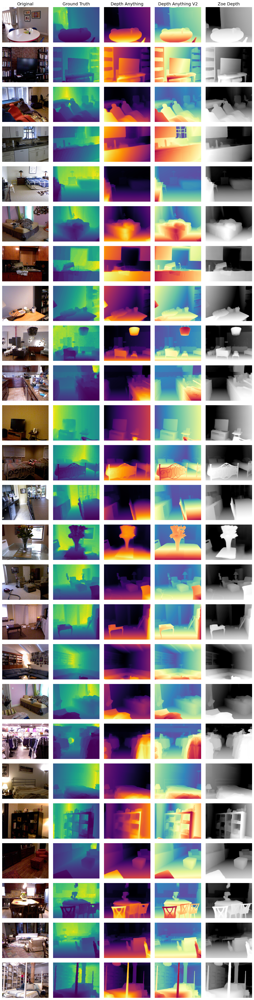

In [111]:
visualize_image_grid(images_lists, titles)

In [21]:
test_images = load_data_from_folder(paths_depths["original"])
dav1_depths = load_data_from_folder(paths_depths["dav1"])
dav2_depths = load_data_from_folder(paths_depths["dav2"])
zoe_depths = load_data_from_folder(paths_depths["zoe"])
if len(test_images) == len(dav1_depths) == len(dav2_depths) == len(zoe_depths):
    print(f"Number of images: {len(test_images)}")

Number of images: 650


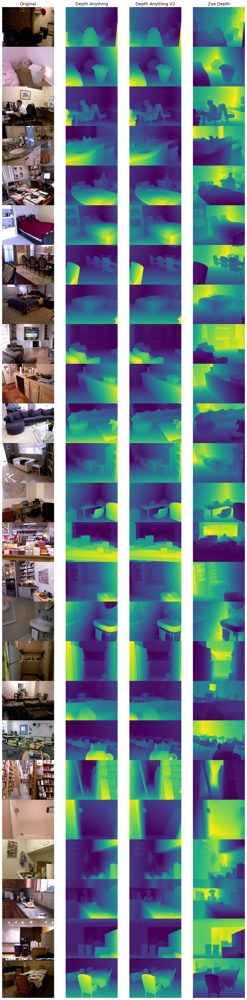

In [19]:
depths_list = [test_images, dav1_depths, dav2_depths, zoe_depths]
titles = ["Original", "Depth Anything", "Depth Anything V2", "Zoe Depth"]
visualize_image_grid(depths_list, titles, 25, 4)

In [24]:
original_train = load_data_from_folder(paths_train_depths["original"])
ground_truths = load_data_from_folder(paths_train_depths["gt"])
dav1_train_depths = load_data_from_folder(paths_train_depths["dav1"])
dav2_train_depths = load_data_from_folder(paths_train_depths["dav2"])
zoe_train_depths = load_data_from_folder(paths_train_depths["zoe"])
if len(original_train) == len(ground_truths) == len(dav1_train_depths) == len(dav2_train_depths) == len(zoe_train_depths):
    print(f"Number of images: {len(original_train)}")

Number of images: 25


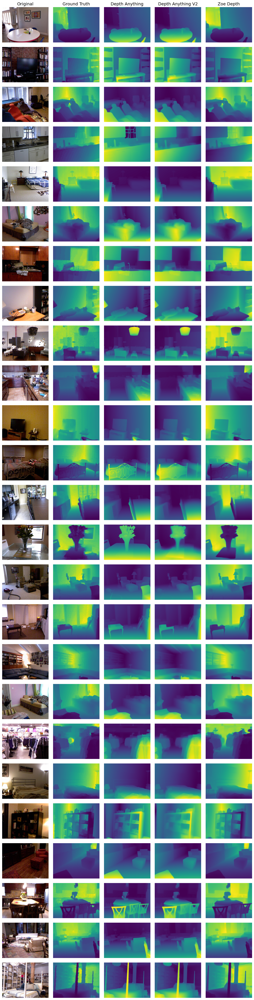

In [11]:
train_depths_list = [original_train, ground_truths, dav1_train_depths, dav2_train_depths, zoe_train_depths]
titles = ["Original", "Ground Truth", "Depth Anything", "Depth Anything V2", "Zoe Depth"]
visualize_image_grid(train_depths_list, titles)

In [112]:
np.mean(np.abs(dav1_images[0] - dav2_images[0])) 

np.float64(149.52569584171698)

In [113]:
np.mean(np.abs(ground_truths[0] - dav2_images[0])) 

ValueError: operands could not be broadcast together with shapes (426,560) (426,560,3) 

In [19]:
sample = invert_values(dav1_train_depths[0])

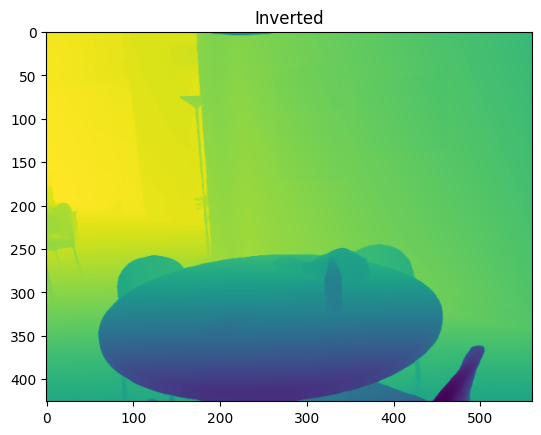

In [28]:
plot_single_image(sample, "Inverted")

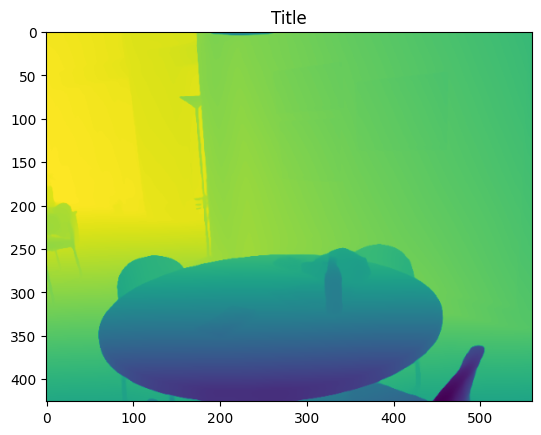

In [27]:
normalized = (sample - sample.min()) / (sample.max() - sample.min())
plot_single_image(normalized)

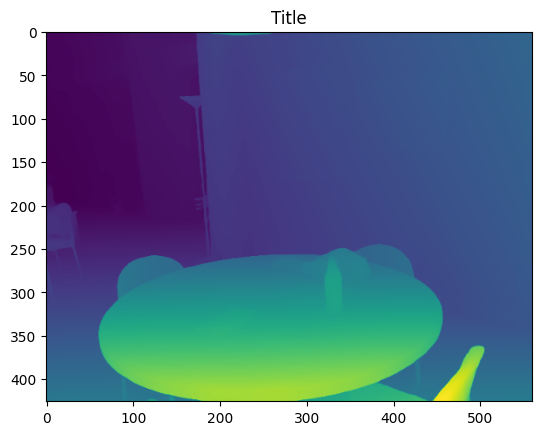

In [24]:
plot_single_image(dav1_train_depths[0])

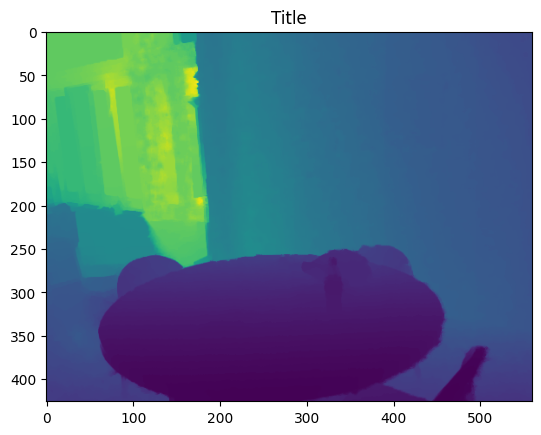

In [25]:
plot_single_image(ground_truths[0])

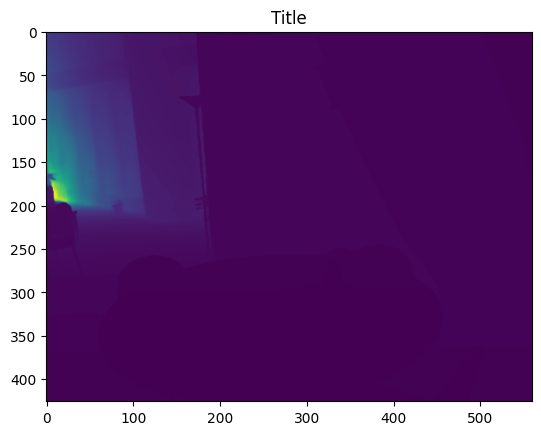

In [33]:
sample2 =  1.0 / (dav1_train_depths[0]+ 1e-6)
normalized2 = (sample2 - sample.min()) / (sample.max() - sample.min())
plot_single_image(sample2)

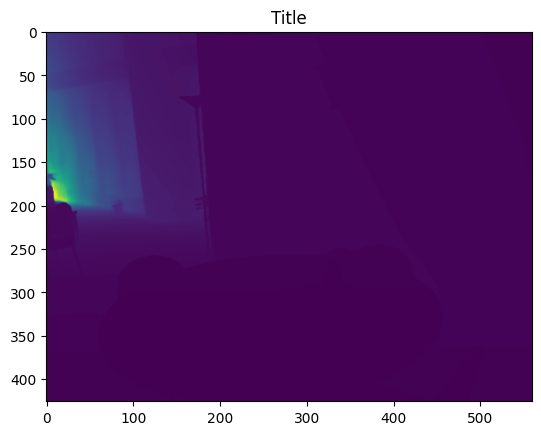

In [34]:
plot_single_image(normalized2)

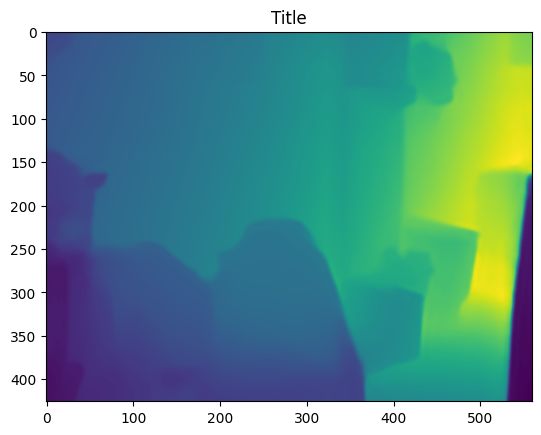

In [9]:
zoe_nk = load_data_from_folder("/home/lucijatonkovic/Documents/Data/CIL/PredictionDepths/NoTuning/ZoeDepth_NK")
plot_single_image(zoe_nk[0])

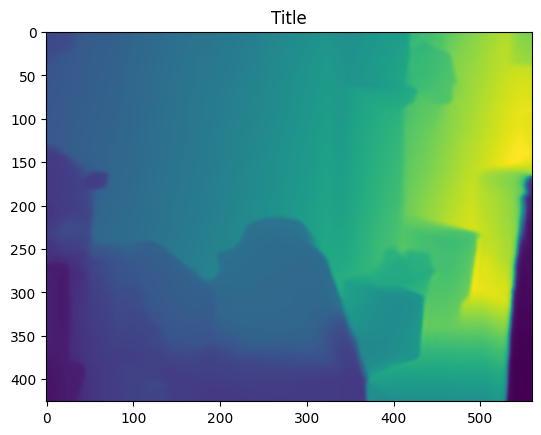

In [10]:
zoe = load_data_from_folder("/home/lucijatonkovic/Documents/Data/CIL/PredictionDepths/NoTuning/ZoeDepth_npy")
plot_single_image(zoe[0])

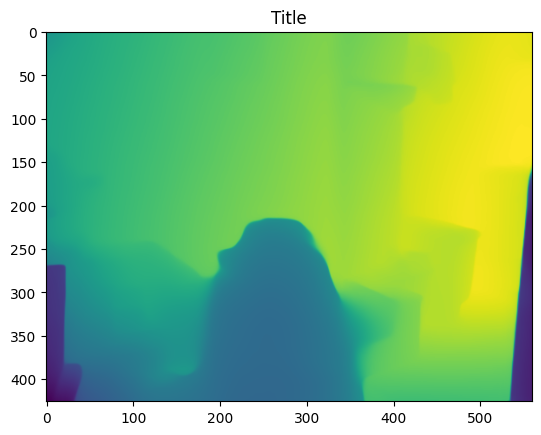

In [23]:
plot_single_image(dav1_depths[0] * (-1))

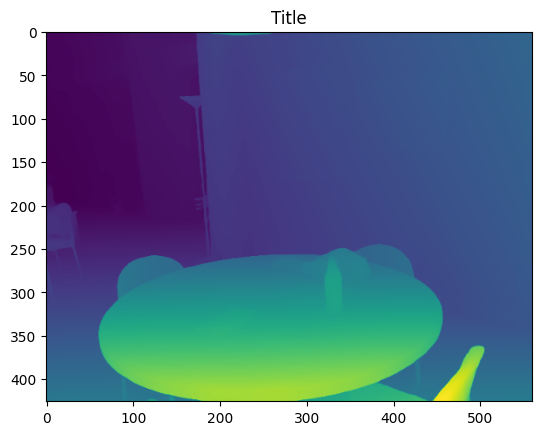

In [25]:
plot_single_image(dav1_train_depths[0])

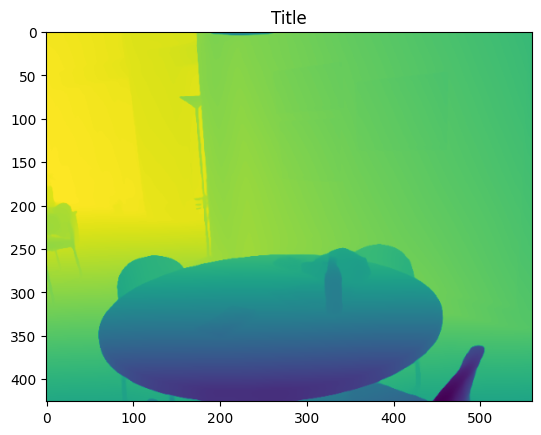

In [ ]:
plot_single_image(dav1_train_depths[0] * (-1))

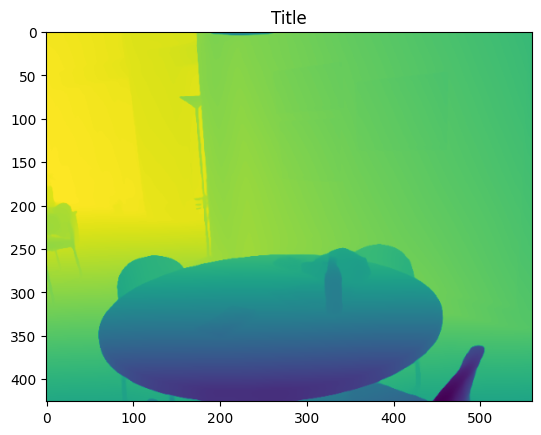

In [36]:
val_to_add = (-1) * (dav1_train_depths[0] * (-1)).min()
new_inverted = (dav1_train_depths[0] * (-1)) + val_to_add
plot_single_image(new_inverted)

TypeError: Invalid shape (650, 426, 560) for image data

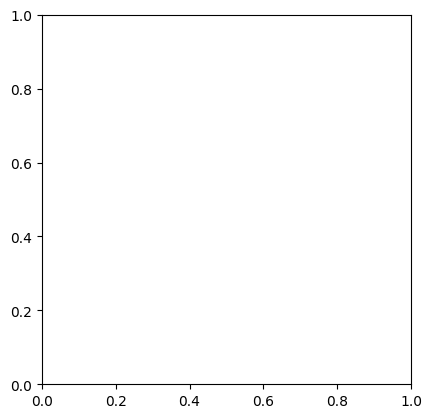

In [50]:
print((new_inverted >= 0).all())

True


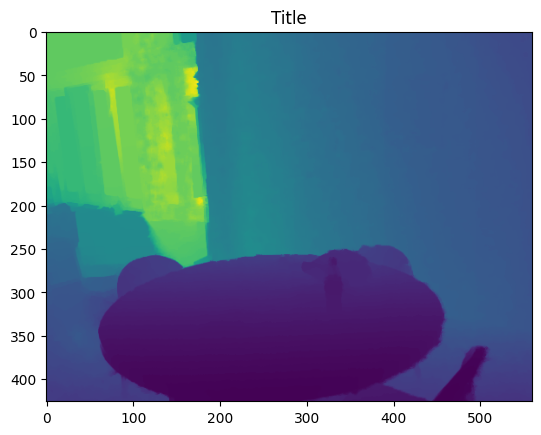

In [27]:
plot_single_image(ground_truths[0])

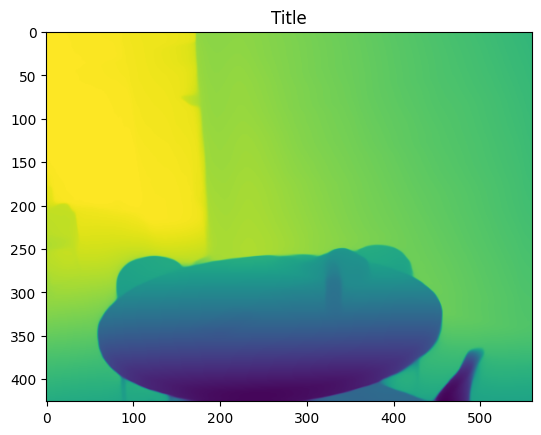

In [31]:
plot_single_image(dav2_train_depths[0] * (-1))